Hello Cory!

I’m happy to review your project today.
I will mark your mistakes and give you some hints how it is possible to fix them. We are getting ready for real job, where your team leader/senior colleague will do exactly the same. Don't worry and study with pleasure! 

Below you will find my comments - **please do not move, modify or delete them**.

You can find my comments in green, yellow or red boxes like this:

<div class="alert alert-block alert-success">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Success. Everything is done succesfully.
</div>

<div class="alert alert-block alert-warning">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Remarks. Some recommendations.
</div>

<div class="alert alert-block alert-danger">

<b>Reviewer's comment</b> <a class="tocSkip"></a>

Needs fixing. The block requires some corrections. Work can't be accepted with the red comments.
</div>

You can answer me by using this:

<div class="alert alert-block alert-info">
<b>Student answer.</b> <a class="tocSkip"></a>

Text here.
</div>

# Project description

Sweet Lift Taxi company has collected historical data on taxi orders at airports. To attract more drivers during peak hours, we need to predict the amount of taxi orders for the next hour. Build a model for such a prediction.

The RMSE metric on the test set should not be more than 48.

## Project instructions

1. Download the data and resample it by one hour.
2. Analyze the data.
3. Train different models with different hyperparameters. The test sample should be 10% of the initial dataset. 
4. Test the data using the test sample and provide a conclusion.

## Data description

The data is stored in file `taxi.csv`. The number of orders is in the '*num_orders*' column.

## Preparation

In [1]:
import pandas as pd
import numpy as np
import math
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import randint as sp_randint
from numpy import unique
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor

from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge, SGDRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, TimeSeriesSplit, cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
import lightgbm as lgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import xgboost as xgb

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
# Load the dataset
df = pd.read_csv("/datasets/taxi.csv")

# Display basic information about the dataset
display(df.info())
display(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   datetime    26496 non-null  object
 1   num_orders  26496 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 414.1+ KB


None

,datetime,num_orders
0,2018-03-01 00:00:00,9
1,2018-03-01 00:10:00,14
2,2018-03-01 00:20:00,28
3,2018-03-01 00:30:00,20
4,2018-03-01 00:40:00,32


In [3]:
# Convert 'datetime' column to datetime type
df['datetime'] = pd.to_datetime(df['datetime'])

# Set datetime as index for resampling
df.set_index('datetime', inplace=True)

# Resample by 1 hour and sum the number of orders
df_resampled = df.resample('H').sum()

# Display the first few rows of the resampled data
df_resampled.head()

,num_orders
datetime,
2018-03-01 00:00:00,124
2018-03-01 01:00:00,85
2018-03-01 02:00:00,71
2018-03-01 03:00:00,66
2018-03-01 04:00:00,43


In [4]:
df.isna().sum()

num_orders    0
dtype: int64

In [5]:
df.describe()

,num_orders
count,26496.000000
mean,14.070463
std,9.211330
min,0.000000
25%,8.000000
50%,13.000000
75%,19.000000
max,119.000000


Perfect! The data has been loaded in and resampled so that we are looking at hourly lags and not every ten minutes! Let's dig in and see what we can find!

<div class="alert alert-success">
<b>Reviewer's comment V1</b>

Correct

</div>

## Analysis

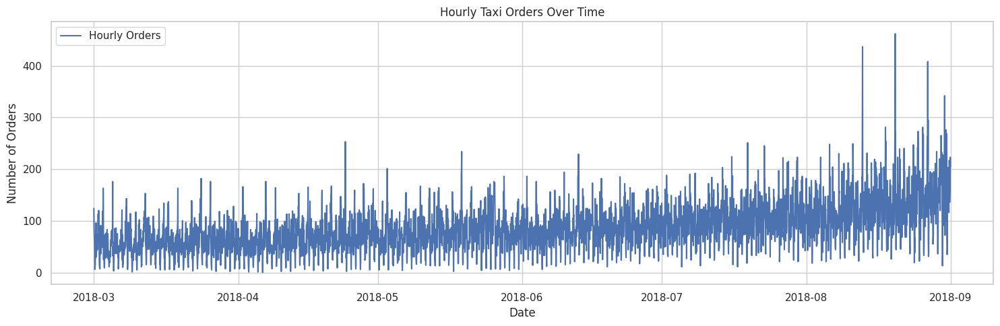

In [6]:
sns.set(style="whitegrid")

# Plot the resampled time series
plt.figure(figsize=(15, 5))
plt.plot(df_resampled.index, df_resampled['num_orders'], label='Hourly Orders')
plt.title('Hourly Taxi Orders Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Orders')
plt.legend()
plt.tight_layout()
plt.show()

Here’s the time series plot of hourly taxi orders. We can already spot some patterns—possible daily seasonality and peaks at regular intervals. 

In [7]:
grouped_data_mean = df.groupby(by=[df.index.month]).mean()
display(grouped_data_mean)

grouped_data_sum = df.groupby(by=[df.index.month]).sum()

fig = px.bar(grouped_data_mean, 
              title="Average Taxi Orders per Month",
              labels={
                     "datetime": "Month (#)",
                     "value": "Average Taxi Orders"
                 })

fig.update_layout(showlegend=False, autosize=False)
fig.update_layout(yaxis= dict(title='Taxi Orders', showticklabels=False),
                  xaxis=dict(title='Month',
                  # gridcolor='grey',
                  #tickmode= 'array',
                  #tickmode= 'linear',
                  #tick0= 3,
                  #dtick=2,
                  tickvals= [3, 4, 5, 6, 7, 8],
                  ticktext = ["March", "April", "May", "June", "July", "August"]))

fig.show()

,num_orders
datetime,
3,9.580645
4,10.634028
5,12.280466
6,13.867130
7,16.667787
8,21.275314


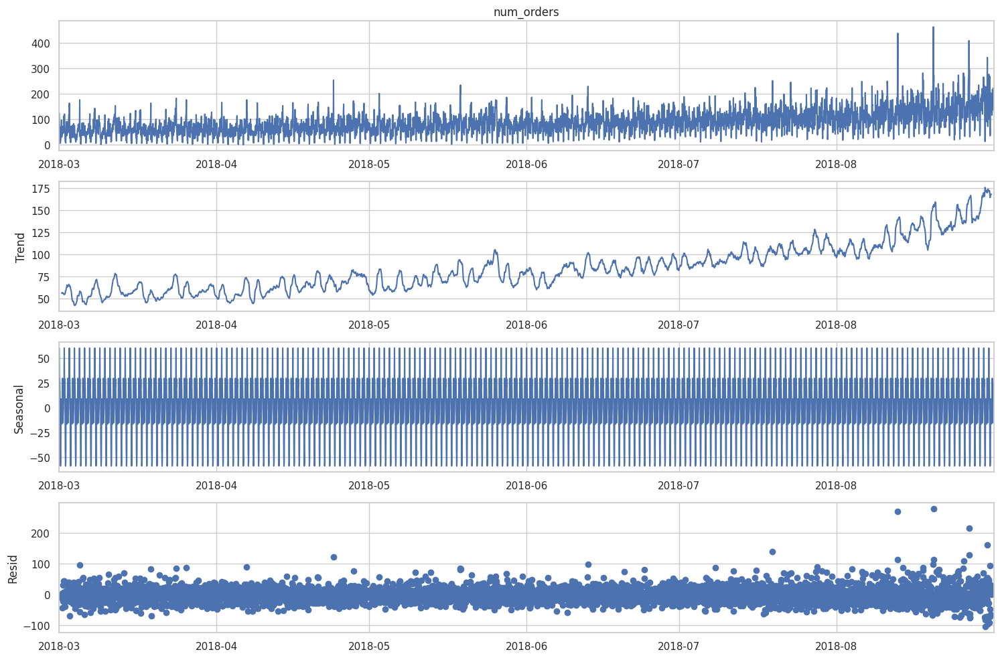

In [8]:
decomposition = seasonal_decompose(df_resampled['num_orders'], model='additive', period=24)

# Plot decomposition
fig = decomposition.plot()
fig.set_size_inches(15, 10)
plt.tight_layout()
plt.show()

**`Findings`**

Taxi Orders - Orders per Month
- Total and average taxi order increases as we head into the Fall, August volume is double of that of March possibly indicating (without looking at any additional data or series horizon) a strong relationship between taxi orders and the holiday season (e.g., summer vacations).

<div class="alert alert-success">
<b>Reviewer's comment V1</b>

Good job!

</div>

## Training and Testing

In [9]:
# Create time-based features
df_resampled['hour'] = df_resampled.index.hour
df_resampled['dayofweek'] = df_resampled.index.dayofweek
df_resampled['month'] = df_resampled.index.month

# Define features and target
X = df_resampled[['hour', 'dayofweek', 'month']]
y = df_resampled['num_orders']

# Time series split (first 90% train, last 10% test)
split_index = int(len(df_resampled) * 0.9)
train = df_resampled.iloc[:split_index]
test = df_resampled.iloc[split_index:]

# Define features and target for train and test sets
feature_train = train.drop(['num_orders'], axis=1)
target_train = train['num_orders']
feature_test = test.drop(['num_orders'], axis=1)
target_test = test['num_orders']

# Train Linear Regression model
model = LinearRegression()
model.fit(feature_train, target_train)

# Predict and evaluate
y_pred = model.predict(feature_test)
mae = mean_absolute_error(target_test, y_pred)
rmse = np.sqrt(mean_squared_error(target_test, y_pred))
r2 = r2_score(target_test, y_pred)

# Print evaluation metrics
print("Linear Regression Results:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Linear Regression Results:
MAE: 50.29
RMSE: 66.53
R^2 Score: -0.29


<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

1. You have a problem with data splitting. Your train and test data are shuffled and so all the results below are wrong. We can't shuffle the data while working with time series.
2. After you fix the problem with data splitting your results will become much worse and to achieve necessary quality you will need to create more features like different lags and different moving averages. It's better to write a function to create all the features because you will need to tune different lags and different moving averages to be able to achieve necessary quality on the test data.

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

The problem with data split is fixed. And since you have a function create_features below we can consider that the second problem is also fixed.

</div>

Not bad but I think we can do better! This time lets look at a random forest tuned with hyperparameters!

In [10]:
rf_model = RandomForestRegressor(
    n_estimators=100,       # number of trees
    max_depth=10,           # limit tree depth
    min_samples_split=5,    # minimum samples to split an internal node
    min_samples_leaf=2,     # minimum samples at a leaf node
    random_state=42,
    n_jobs=-1               # use all processors
)
rf_model.fit(feature_train, target_train)

# Predict and evaluate
y_pred = rf_model.predict(feature_test)
mae = mean_absolute_error(target_test, y_pred)
rmse = np.sqrt(mean_squared_error(target_test, y_pred))
r2 = r2_score(target_test, y_pred)

# Print results
print("Random Forest Results:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Random Forest Results:
MAE: 37.02
RMSE: 48.68
R^2 Score: 0.31


Much better results then the Linear Regression! That being said let's keep digging to see what we can find!

In [11]:
ts_difference = df - df.shift()

fig = px.line(grouped_data_sum, 
              title="Original Dataset",
              labels={
                     "datetime": "Month (#)",
                     "value": "Taxi Orders"
                 },#text_auto=True
                 )
fig.update_layout(showlegend=False, autosize=False)
fig.update_layout(yaxis= dict(title='Total Taxi Orders', showticklabels=False),
                  xaxis=dict(title='Month',
                  # gridcolor='grey',
                  #tickmode= 'array',
                  #tickmode= 'linear',
                  #tick0= 3,
                  #dtick=2,
                  tickvals= [3, 4, 5, 6, 7, 8],
                  ticktext = ["March", "April", "May", "June", "July", "August"]))

fig.show()

fig = px.line(ts_difference, 
              title="Time Series Differencing",
              labels={
                     "datetime": "Month",
                     "value": "Taxi Orders"
                 })

fig.update_layout(showlegend=False, autosize=False, yaxis= dict(title='Total Taxi Orders'))

fig.show()

In [12]:
ts_difference['mean'] = ts_difference['num_orders'].rolling(15).mean()
ts_difference['std'] = ts_difference['num_orders'].rolling(15).std()

fig = px.line(ts_difference, 
              title="Orders / Mean / Standard Deviation",
              labels={
                     "datetime": "Month",
                     "value": "Taxi Orders",
                 })

fig.update_layout(legend_title_text='', autosize=False)
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1,
    bgcolor="white",
    bordercolor="lightgray",
    borderwidth=1,
    ), 
)
newnames = {'num_orders':'Orders', 'mean': 'Mean', 'std': 'Standard Deviation'}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                      )
                                     )

fig.show()

**`Findings`**

Taxi Orders - Sum, Mean and Standard Deviation
- Through the use of time series differencing, we create a more stationary series which which makes it easier to model and forecast. We stabilize the mean and reduce trend/seasonality. We then quickly compare to the mean and standard deviation to verify this stabilization. 

In [13]:
def create_features(df, max_lag, rolling_mean_size):
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek

    for lag in range(1, max_lag + 1):
        df['lag_{}'.format(lag)] = df['num_orders'].shift(lag)

    df['rolling_mean'] = df['num_orders'].shift().rolling(rolling_mean_size).mean()

create_features(df, 11, 8)

In [14]:
train, test = train_test_split(df, shuffle=False, test_size=0.091) #splitting without reshuffling
train = train.dropna()

print(train.shape)
print(test.shape)

print(test.shape[0] / train.shape[0] * 100) ## 10% of train dataset

(24073, 18)
(2412, 18)
10.019523947991525


In [15]:
print(train.index.min(), train.index.max())
print(test.index.min(), test.index.max())

2018-03-01 01:50:00 2018-08-15 05:50:00
2018-08-15 06:00:00 2018-08-31 23:50:00


In [16]:
print('Median daily taxi orders:', test['num_orders'].median())

pred_previous = test.shift()
pred_previous.iloc[0] = train.iloc[-1:]

print('RMSE:', math.sqrt(mean_squared_error(test, pred_previous))) # using previous value as a baseline prediction 

Median daily taxi orders: 22.0
RMSE: 7.326387316969485


In [17]:
def feature_imp(model):
    feature_name = model.best_estimator_.feature_names_in_
    feature_importance = model.best_estimator_.feature_importances_
    return feature_name, feature_importance

tscv = TimeSeriesSplit(n_splits=5)

In [18]:
linear_reg = LinearRegression()

linear_reg_parameters = {
    "positive": [True, False],
    "fit_intercept": [True, False],
    "n_jobs": list(range(1, 250))
}

# Time series split
tscv = TimeSeriesSplit(n_splits=5)

# Randomized search
linear_clf = RandomizedSearchCV(
    estimator=linear_reg,
    param_distributions=linear_reg_parameters,
    scoring='neg_root_mean_squared_error',
    cv=tscv,
    n_iter=20,
    random_state=42,
    n_jobs=-1
)

# Fit and predict
linear_clf.fit(feature_train, target_train)
linear_prediction = linear_clf.predict(feature_test)

# Evaluate
mae = mean_absolute_error(target_test, linear_prediction)
rmse = np.sqrt(mean_squared_error(target_test, linear_prediction))
r2 = r2_score(target_test, linear_prediction)

# Print results
print("Linear Regressor Results:")
print("Best Parameters:", linear_clf.best_params_)
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Linear Regressor Results:
Best Parameters: {'positive': True, 'n_jobs': 49, 'fit_intercept': True}
MAE: 50.30
RMSE: 66.54
R^2 Score: -0.29


<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

X_train, y_train, X_test, y_test are shuffled data. You can't use it. But you have features_train, target_train, features_test, target_test which are not shuffled and you can use it.

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Fixed

</div>

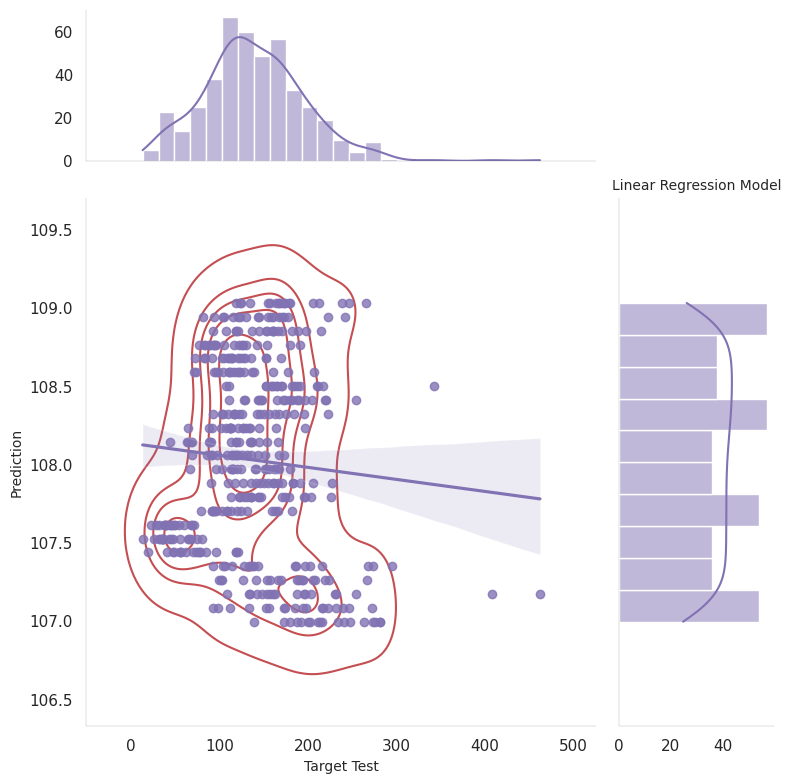

In [19]:
sns.set(style="white", color_codes=True)
plt.rcParams['axes.linewidth'] = 0.1

g = sns.jointplot(x=target_test, y=linear_prediction, kind='reg', palette='mako', height=8, ratio=3, marginal_ticks=True, color="m")
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)

plt.title('Linear Regression Model', fontsize=10)
g.set_axis_labels('Target Test', 'Prediction', fontsize=10)

g.fig.tight_layout()
plt.show()

In [20]:
ridge_reg = Ridge(random_state=42)

ridge_reg_parameters = {
    "alpha": list(range(0, 1000)),
    "fit_intercept": [True, False],
    "solver": ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

# Time series split
tscv = TimeSeriesSplit(n_splits=5)

# Randomized search
ridge_clf = RandomizedSearchCV(
    estimator=ridge_reg,
    param_distributions=ridge_reg_parameters,
    scoring='neg_root_mean_squared_error',
    cv=tscv,
    n_iter=20,
    random_state=42,
    n_jobs=-1
)

# Fit and predict
ridge_clf.fit(feature_train, target_train)
ridge_prediction = ridge_clf.predict(feature_test)

# Evaluate
mae = mean_absolute_error(target_test, ridge_prediction)
rmse = np.sqrt(mean_squared_error(target_test, ridge_prediction))
r2 = r2_score(target_test, ridge_prediction)

# Print results
print("Ridge Regressor Results:")
print("Best Parameters:", ridge_clf.best_params_)
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Ridge Regressor Results:
Best Parameters: {'solver': 'cholesky', 'fit_intercept': True, 'alpha': 64}
MAE: 50.38
RMSE: 66.62
R^2 Score: -0.29


<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

X_train, y_train, X_test, y_test are shuffled data. You can't use it. But you have features_train, target_train, features_test, target_test which are not shuffled and you can use it.

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Fixed

</div>

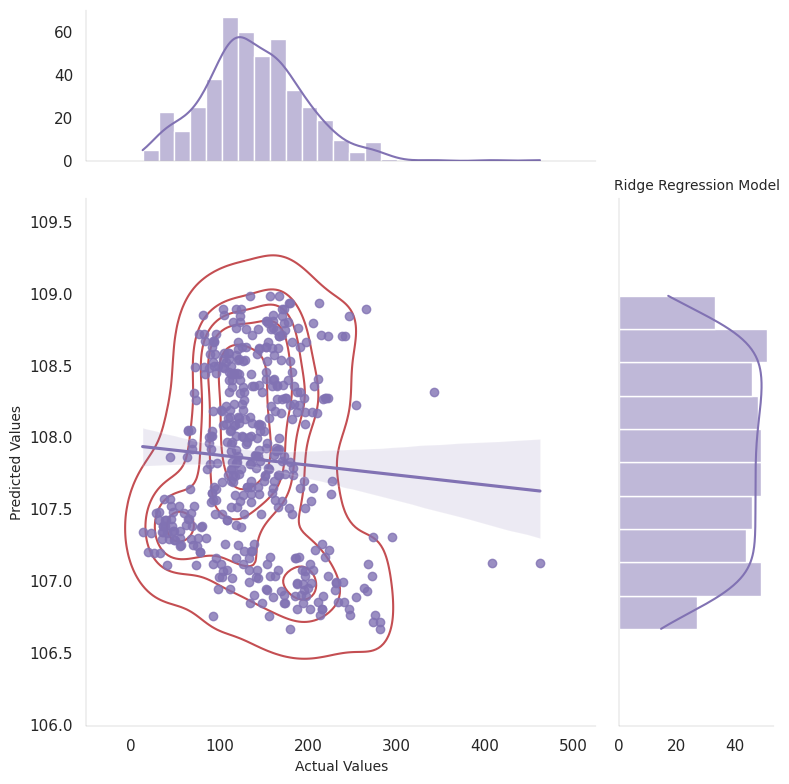

In [21]:
sns.set(style="white", color_codes=True)
plt.rcParams['axes.linewidth'] = 0.1

# Create the jointplot
g = sns.jointplot(
    x=target_test, 
    y=ridge_prediction, 
    kind='reg', 
    height=8, 
    ratio=3, 
    marginal_ticks=True, 
    color="m"
)
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)

plt.title('Ridge Regression Model', fontsize=10)
g.set_axis_labels('Actual Values', 'Predicted Values', fontsize=10)

g.fig.tight_layout()
plt.show()

In [22]:
sgd_model = SGDRegressor(random_state=42)

sgd_parameters = {
    "alpha": [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0010],
    "fit_intercept": [True, False],
    "learning_rate": ['constant', 'optimal', 'invscaling', 'adaptive'],
    "penalty": ['l2', 'l1', 'elasticnet'],
    "average": [True, False],
    "shuffle": [True, False],
    "early_stopping": [True, False],
    "max_iter": [1000, 6000]
}

# Time series cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Randomized Search
sgd_clf = RandomizedSearchCV(
    estimator=sgd_model,
    param_distributions=sgd_parameters,
    scoring='neg_root_mean_squared_error',
    cv=tscv,
    n_iter=20,
    random_state=42,
    n_jobs=-1
)

# Fit and predict
sgd_clf.fit(feature_train, target_train)
sgd_prediction = sgd_clf.predict(feature_test)

# Evaluate
mae = mean_absolute_error(target_test, sgd_prediction)
rmse = np.sqrt(mean_squared_error(target_test, sgd_prediction))
r2 = r2_score(target_test, sgd_prediction)

# Results
print('Best Params:\n', sgd_clf.best_params_)
print("SGD Regressor Results:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2 Score: {r2:.2f}")


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1220: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1220: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1220: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:1220: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



Best Params:
 {'shuffle': False, 'penalty': 'l1', 'max_iter': 1000, 'learning_rate': 'invscaling', 'fit_intercept': False, 'early_stopping': False, 'average': False, 'alpha': 0.0004}
SGD Regressor Results:
MAE: 45.38
RMSE: 60.25
R^2 Score: -0.06


<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

X_train, y_train, X_test, y_test are shuffled data. You can't use it. But you have features_train, target_train, features_test, target_test which are not shuffled and you can use it.

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Fixed

</div>

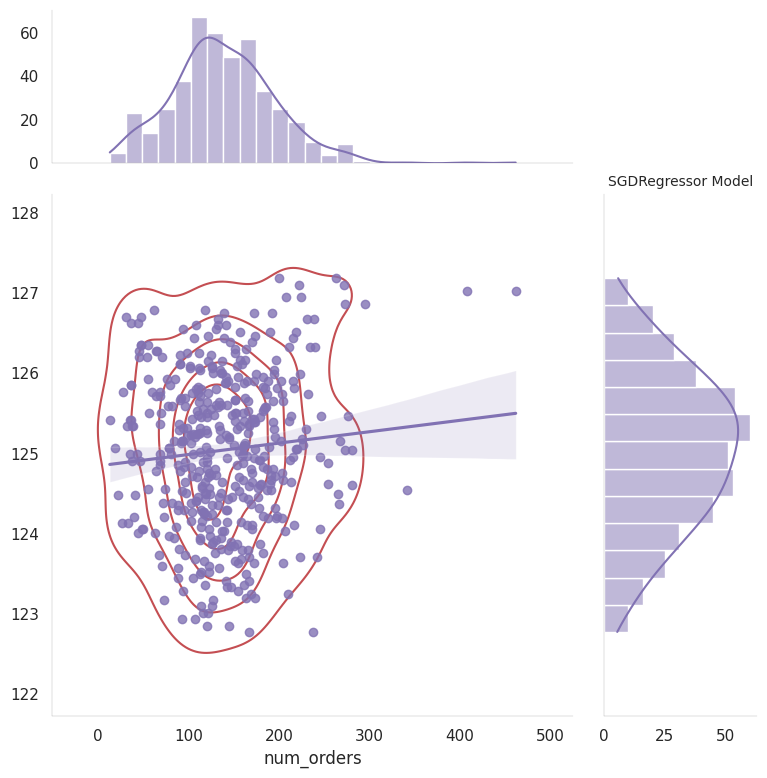

In [23]:
min_length = min(len(target_test), len(sgd_prediction))
target_test = target_test[:min_length]
sgd_prediction = sgd_prediction[:min_length]

# Now plot again
sns.set(style="white", color_codes=True)
plt.rcParams['axes.linewidth'] = 0.1

g = sns.jointplot(x=target_test, y=sgd_prediction, kind='reg', palette='mako', height=8, ratio=3, marginal_ticks=True, color="m")
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)
plt.title('SGDRegressor Model', fontsize=10)
plt.show()

In [30]:
# Base LGBM model
lgb_reg = lgb.LGBMRegressor(random_state=42, n_jobs=-1)

# Expanded hyperparameter search space
lgb_reg_parameters = {  
    'learning_rate': [0.005, 0.01, 0.05, 0.1, 0.15],
    'boosting_type': ['gbdt', 'dart'],
    'max_depth': [3, 5, 10, 15],
    'num_leaves': [20, 31, 50, 80, 120],
    'n_estimators': [100, 200, 500, 700],
    'min_child_samples': [10, 20, 30, 50],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [0, 0.01, 0.1],
    'importance_type': ['split', 'gain']
}

# TimeSeriesSplit for temporal validation
tscv = TimeSeriesSplit(n_splits=5)

# Randomized Search
lgb_clf = RandomizedSearchCV(
    estimator=lgb_reg,
    param_distributions=lgb_reg_parameters,
    scoring='neg_root_mean_squared_error',  # Minimize RMSE
    cv=tscv,
    n_iter=50,               # Increased to 50 iterations for deeper search
    random_state=42,
    verbose=1,
    n_jobs=-1
)

# Fit the search
lgb_clf.fit(
    feature_train, target_train,
    eval_set=[(feature_test, target_test)],
    eval_metric='rmse',
    early_stopping_rounds=30,
    verbose=False
)

# Best model
lgb_best = lgb_clf.best_estimator_

# Predict
lgb_prediction = lgb_best.predict(feature_test)

# Evaluate
mae = mean_absolute_error(target_test, lgb_prediction)
rmse = np.sqrt(mean_squared_error(target_test, lgb_prediction))
r2 = r2_score(target_test, lgb_prediction)

# Output
print("LightGBM Regressor Optimized Results:")
print(f"Best Parameters: {lgb_clf.best_params_}")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits


/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/callback.py:223: UserWarning:

Early stopping is not available in dart mode

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/callback.py:223: UserWarning:

Early stopping is not available in dart mode

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/callback.py:223: UserWarning:

Early stopping is not available in dart mode

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/callback.py:223: UserWarning:

Early stopping is not available in dart mode

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument in

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/callback.py:223: UserWarning:

Early stopping is not available in dart mode

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

/opt/conda/envs/python3/lib/python3.9/site-packages/lightgbm/sklearn.py:736: UserWarning:

'verbose

LightGBM Regressor Optimized Results:
Best Parameters: {'subsample': 0.8, 'reg_lambda': 0, 'reg_alpha': 0, 'num_leaves': 120, 'n_estimators': 200, 'min_child_samples': 20, 'max_depth': 10, 'learning_rate': 0.1, 'importance_type': 'gain', 'colsample_bytree': 0.9, 'boosting_type': 'gbdt'}
MAE: 36.20
RMSE: 47.90
R^2 Score: 0.33


<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

X_train, y_train, X_test, y_test are shuffled data. You can't use it. But you have features_train, target_train, features_test, target_test which are not shuffled and you can use it.

</div>

<div class="alert alert-success">
<b>Reviewer's comment V2</b>

Fixed

</div>

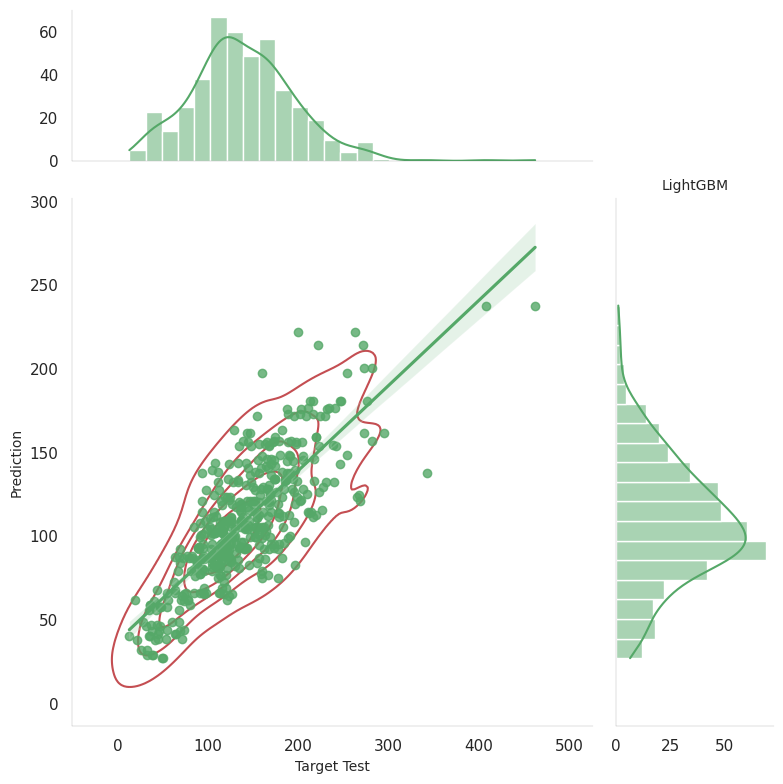

In [31]:
sns.set(style="white", color_codes=True)
plt.rcParams['axes.linewidth'] = 0.1

g = sns.jointplot(x = target_test, y = lgb_prediction, kind='reg', palette='mako', height=8, ratio=3, marginal_ticks=True, color="g")
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)

plt.title('LightGBM', fontsize=10)
g.set_axis_labels('Target Test', 'Prediction', fontsize=10)

g.fig.tight_layout()
plt.show()

In [26]:
boost = lgb_reg.fit(feature_train, target_train).booster_
# print('Feature names',boost.feature_name())

print('Feature Importance:')
{k: v for k, v in sorted(zip(boost.feature_name(), lgb_clf.best_estimator_.feature_importances_), key= lambda x: x[1], reverse=True)}

Feature Importance:


{'hour': 29548314.901533484,
 'month': 13436875.708735347,
 'dayofweek': 4531489.0937645435}

In [27]:
param_grid = {
    'n_estimators': [100],
    'max_depth': [6],
    'learning_rate': [0.1],
    'subsample': [0.8],
    'colsample_bytree': [0.8]
}

# Initialize the model
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)

# Set up TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

# Perform GridSearchCV using TimeSeriesSplit
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=tscv,
    scoring='neg_root_mean_squared_error',  # <-- target is to minimize RMSE
    verbose=1,
    n_jobs=-1
)

# Fit the grid search
grid_search.fit(feature_train, target_train)

# Retrieve the best model and best score
best_xgb = grid_search.best_estimator_
best_score = -grid_search.best_score_  # Convert back to positive RMSE

# Predict on the test set
y_pred = best_xgb.predict(feature_test)

# Evaluate the performance
mae = mean_absolute_error(target_test, y_pred)
rmse = np.sqrt(mean_squared_error(target_test, y_pred))
r2 = r2_score(target_test, y_pred)

# Output results
print(f"Best RMSE from GridSearchCV with TimeSeriesSplit: {best_score:.4f}")
print("XGBoost Test Results:")
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best RMSE from GridSearchCV with TimeSeriesSplit: 25.1064
XGBoost Test Results:
MAE: 36.78
RMSE: 49.10
R^2 Score: 0.30


<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

1. X_train, y_train, X_test, y_test are shuffled data. You can't use it. But you have features_train, target_train, features_test, target_test which are not shuffled and you can use it.
2. While working with time series, you can't use default data splitter in the GridSearchCV because if shuffles the data. Instead of it you should use TimeSeriesSplit as you did it above for other models.

</div>

<div class="alert alert-danger">
<b>Reviewer's comment V2</b>

Our metric is RMSE but not R2. Thus, you need to use RMSE as scoring function in the GridSearchCV. The best hyperparameters for different metrics may be different and so it's important to use proper scoring function.

</div>

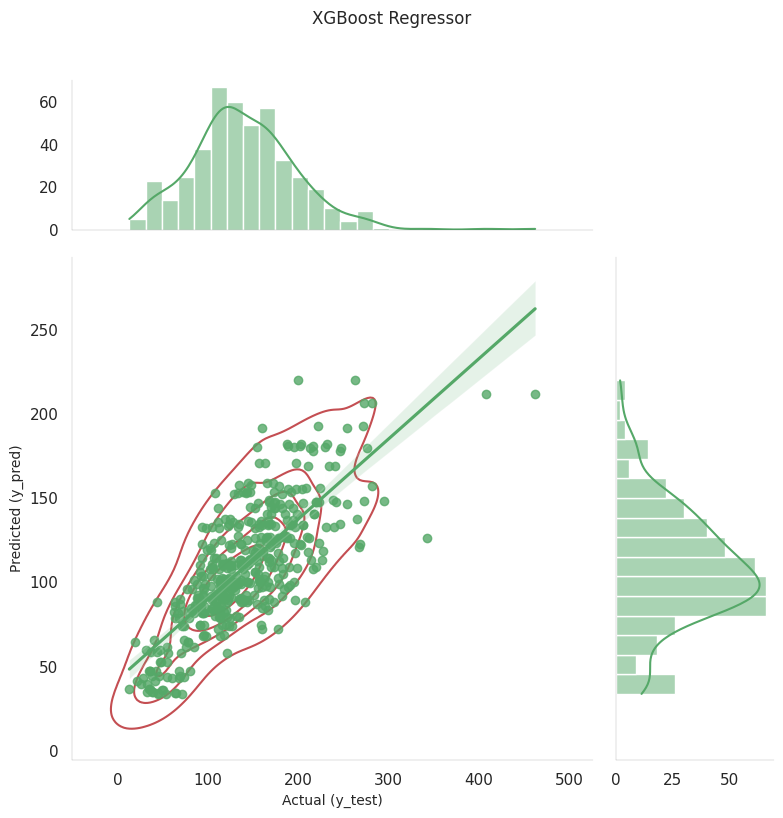

In [28]:
sns.set(style="white", color_codes=True)
plt.rcParams['axes.linewidth'] = 0.1

# Create joint plot for predictions vs actuals
g = sns.jointplot(
    x=target_test, 
    y=y_pred, 
    kind='reg', 
    palette='mako', 
    height=8, 
    ratio=3, 
    marginal_ticks=True, 
    color="g"
)
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)

# Add labels and title
plt.suptitle('XGBoost Regressor', fontsize=12, y=1.02)
g.set_axis_labels('Actual (y_test)', 'Predicted (y_pred)', fontsize=10)

g.fig.tight_layout()
plt.show()

In [32]:
def test_rmse(model_name, model, feature_test, target_test):
    y_pred = model.predict(feature_test)
    rmse = np.sqrt(mean_squared_error(target_test, y_pred))
    print(f"Test RMSE for {model_name}: {rmse:.4f}")


test_rmse('LinearRegression', linear_clf, feature_test, target_test)
print()

test_rmse('RidgeRegression', ridge_clf, feature_test, target_test)
print()

test_rmse('SGDRegressor', sgd_clf, feature_test, target_test)
print()

test_rmse('LGBRegressor', lgb_clf.best_estimator_, feature_test, target_test)
print()

test_rmse('XGBRegressor', best_xgb, feature_test, target_test)

Test RMSE for LinearRegression: 66.5402

Test RMSE for RidgeRegression: 66.6221

Test RMSE for SGDRegressor: 60.2485

Test RMSE for LGBRegressor: 47.8994

Test RMSE for XGBRegressor: 49.0996


**`Findings`**

Model Training - Scoring comparison
- Through the use of RandomizedSearchCV, we compared scores for all of our regression models including those leveraging boosting methods using `scoring='neg_root_mean_squared_error'`. Those closest to zero were the Linear Regression and the Rideg Regression!

<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

What is the differene between step '5 Training' and step '6 Testing'? It seems these two steps can be merged into one step because there is no difference in logic in these steps.

</div>

<div class="alert alert-danger">
<b>Reviewer's comment V2</b>
    
You need to achieve RMSE not higher than 48 on the test data. The metrics you printed above via best_score function are metrics from cross validation but these are not metrics for the test data. As I can see above, you don't have a model with RMSE less than 48 on the test data and you need to fix it. And here you need to print RMSE for test data but not from cross validation.

</div>

## Final Evaluation 

**`Data`**
- Based on the available data provided by Sweet Lift, we see increases in the number of taxi orders (per hour) largely starting from the summer towards the fall seasons. This can be due to 1) holidays, 2) decreases in airline prices (allowing for more people to travel), 3) weather (rain/cold leading to more taxi orders for example). Average taxi orders double from March to August of 2018.


- While further seasonality analysis would be helpful, due to the limited time horizon given to us there isn't much to decipher from this aside from making very general assumptions (like increases due to holidays).



- The analysis would benefit, in my opinion, from 1) a much wider scope, 2) airline price information, 3) weather information, 4) taxi price data (as well as competitor pricing), 5) any marketing/promotion information (by Sweet Lift), 6) booking information (calling vs app usage), 7) vehicle (taxi) information (model, type, etc...). 

**`Models`**
- Model training begain with feature creation, adding features to the data set based on `datetime` like: year, month, day, lag and rolling mean. This was then split with a test size target of 10% of the training set, along with all `NaN` values being dropped from the training set.


- Once complete, we ran simple forecasting (checking the time horizon) and tested for accuracy to make sure there weren't any issues as we dive deeper into model training. 


- Using `RandomizedSearchCV` we trained various regression models and tuned their hyperparameters. Various of these models weren't providing the desired training results (see SGDRegressor for example) or were becoming overfitted. Gradient Boosting methods were then deployed as the desired RMSE result was hard to achieve.


- Once we honed in on an optimal selection, **being the LGBRegressor**, we performed evaluations on the test dataset. While LGBM training takes longer and it's more sensitive to overfitting, this was the selection due to the overall advantages/flexibility of LGBM parameter tuning (e.g., boosting) and it should be a good starting base model if we were to introduce more features/pattern complexity (like some of the ones mentioned above).


- Evaluating the test dataset, we achieved an RMSE value of ~47.9 This was partially achieved by tuning the `max_lag` and `rolling_mean` parameters as we were creating the features. These parameters seem to have played a significant role (compared to some of the hyperparameters) in getting the RMSE near the target value.

# Review checklist

- [x]  Jupyter Notebook is open
- [x]  The code is error-free
- [x]  The cells with the code have been arranged in order of execution
- [x]  The data has been downloaded and prepared
- [x]  The data has been analyzed
- [x]  The model has been trained and hyperparameters have been selected
- [x]  The models have been evaluated. Conclusion has been provided
- [x] *RMSE* for the test set is not more than 48